In [1]:
import os

print("--- Checking Root Input Folder ---")
root_input = '/kaggle/input/'
if os.path.exists(root_input):
    print(os.listdir(root_input))
else:
    print("No /kaggle/input/ folder found.")

print("\n--- Searching for the train directory ---")
# This will hunt down the exact path to the 'train' folder
found_path = None
for dirpath, dirnames, filenames in os.walk(root_input):
    if 'train' in dirnames:
        found_path = os.path.join(dirpath, 'train')
        print(f"FOUND IT: {found_path}")
        
        # Let's peek inside to see how the folders are named
        folders = os.listdir(found_path)
        print(f"Number of folders inside: {len(folders)}")
        if len(folders) > 0:
            print(f"First 5 folder names: {folders[:5]}")
            
            # Let's check inside one of those folders to see the file extension
            sample_folder = os.path.join(found_path, folders[0])
            files = os.listdir(sample_folder)
            if len(files) > 0:
                print(f"First 2 files in {folders[0]}: {files[:2]}")
        break

if not found_path:
    print("Could not find a 'train' directory anywhere in /kaggle/input/")

--- Checking Root Input Folder ---
['competitions']

--- Searching for the train directory ---
FOUND IT: /kaggle/input/competitions/imagenet-object-localization-challenge/ILSVRC/Annotations/CLS-LOC/train
Number of folders inside: 1000
First 5 folder names: ['n01531178', 'n02412080', 'n02098413', 'n01797886', 'n04589890']
First 2 files in n01531178: ['n01531178_10263.xml', 'n01531178_22392.xml']


In [3]:
import os
import glob
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

class SubsetImageNetSR(Dataset):
    def __init__(self, root_dir, target_classes):
        """
        Dynamically loads only the specified 30 classes from the ImageNet directory.
        """
        self.image_paths = []
        self.labels = []
        
        # Map the 30 string IDs to integer labels (0 to 29)
        # Note: For the fixed ResNet-18 loss later, we will use the actual ImageNet class indices,
        # but PyTorch CrossEntropyLoss expects 0-indexed contiguous labels for training.
        self.class_to_idx = {cls_name: i for i, cls_name in enumerate(target_classes)}
        
        print("Scanning dataset directories...")
        for cls_name in target_classes:
            cls_dir = os.path.join(root_dir, cls_name)
            if os.path.exists(cls_dir):
                # Grab all JPEG files in this class folder
                imgs = glob.glob(os.path.join(cls_dir, '*.JPEG'))
                self.image_paths.extend(imgs)
                self.labels.extend([self.class_to_idx[cls_name]] * len(imgs))
        
        print(f"Successfully loaded {len(self.image_paths)} images across {len(target_classes)} classes.")

        # Transformations for Super Resolution
        # 1. Target Image: Clean 224x224 crop
        self.transform_hr = transforms.Compose([
            transforms.RandomCrop(224),
            transforms.ToTensor(),
        ])
        
        # 2. Input Image: 4x Bicubic Downsampling (56x56)
        self.transform_lr = transforms.Compose([
            transforms.Resize((56, 56), interpolation=transforms.InterpolationMode.BICUBIC, antialias=True),
            # No ToTensor() needed here because Resize now accepts Tensors directly in modern PyTorch
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.labels[idx]

        # Generate target (high-res)
        target_image = self.transform_hr(image)
        
        # Generate input (low-res) directly from the target tensor
        input_image = self.transform_lr(target_image)

        return input_image, target_image, torch.tensor(label, dtype=torch.long)

# ==========================================
# Instantiation and DataLoader Setup
# ==========================================

# A diverse set of 30 ImageNet WordNet IDs (Animals, Vehicles, Objects, Food)
target_30_classes = [
    'n01443537', 'n01614925', 'n02084071', 'n02121808', 'n02129604', # Goldfish, Eagle, Dog, Cat, Tiger
    'n02391049', 'n02504013', 'n02691156', 'n02814533', 'n02835271', # Zebra, Elephant, Plane, Wagon, Bike
    'n02958343', 'n03100240', 'n03459775', 'n03670208', 'n03792782', # Camper, Convertible, Grille, Keyboard, MTB
    'n03930630', 'n04037443', 'n04146614', 'n04285008', 'n04330267', # Pickup, Racer, School Bus, Sports Car, Stove
    'n04462747', 'n04562935', 'n04599235', 'n07716906', 'n07734744', # Tractor, Parachute, Wool, Squash, Mushroom
    'n07747607', 'n07753592', 'n07760859', 'n07873807', 'n07930864'  # Orange, Banana, Apple, Pizza, Cup
]

# Kaggle's default path for the ImageNet training setkaggle_imagenet_path = '/kaggle/input/competitions/imagenet-object-localization-challenge'
kaggle_imagenet_path = '/kaggle/input/competitions/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train'

# Initialize the Dataset
sr_dataset = SubsetImageNetSR(root_dir=kaggle_imagenet_path, target_classes=target_30_classes)

# Initialize the DataLoader (Batch size 20 as per the paper)
train_loader = DataLoader(sr_dataset, batch_size=20, shuffle=True, num_workers=2, pin_memory=True)

# Quick test to verify shapes
dataiter = iter(train_loader)
inputs, targets, labels = next(dataiter)
print(f"Input Low-Res Shape: {inputs.shape}")   # Should be [20, 3, 56, 56]
print(f"Target High-Res Shape: {targets.shape}") # Should be [20, 3, 224, 224]

Scanning dataset directories...
Successfully loaded 32439 images across 30 classes.


ValueError: Caught ValueError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/_utils/worker.py", line 358, in _worker_loop
    data = fetcher.fetch(index)  # type: ignore[possibly-undefined]
           ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/_utils/fetch.py", line 54, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
            ~~~~~~~~~~~~^^^^^
  File "/tmp/ipykernel_55/597933472.py", line 54, in __getitem__
    target_image = self.transform_hr(image)
                   ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torchvision/transforms/transforms.py", line 95, in __call__
    img = t(img)
          ^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py", line 1776, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py", line 1787, in _call_impl
    return forward_call(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torchvision/transforms/transforms.py", line 689, in forward
    i, j, h, w = self.get_params(img, self.size)
                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torchvision/transforms/transforms.py", line 648, in get_params
    raise ValueError(f"Required crop size {(th, tw)} is larger than input image size {(h, w)}")
ValueError: Required crop size (224, 224) is larger than input image size (220, 288)


In [6]:
import math
import torch
from torch import nn

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(channels)
        self.prelu = nn.PReLU()
        self.conv2 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(channels)

    def forward(self, x):
        residual = self.conv1(x)
        residual = self.bn1(residual)
        residual = self.prelu(residual)
        residual = self.conv2(residual)
        residual = self.bn2(residual)
        return x + residual # The crucial skip connection

class UpsampleBlock(nn.Module):
    def __init__(self, in_channels, up_scale):
        super(UpsampleBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, in_channels * up_scale ** 2, kernel_size=3, padding=1)
        self.pixel_shuffle = nn.PixelShuffle(up_scale)
        self.prelu = nn.PReLU()

    def forward(self, x):
        x = self.conv(x)
        x = self.pixel_shuffle(x)
        x = self.prelu(x)
        return x

class SRResNet(nn.Module):
    def __init__(self, upscale_factor=4, num_residual_blocks=16):
        super(SRResNet, self).__init__()
        
        # Initial Feature Extraction
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )
        
        # 16 Residual Blocks (as specified in the paper's baseline)
        self.res_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(num_residual_blocks)]
        )
        
        # Middle Convolution
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )
        
        # Upsampling Layers
        upsample_blocks = []
        for _ in range(int(math.log2(upscale_factor))):
            upsample_blocks.append(UpsampleBlock(64, 2))
        self.upsampling = nn.Sequential(*upsample_blocks)
        
        # Final Output Layer (bringing it back to 3 RGB channels)
        self.conv3 = nn.Conv2d(64, 3, kernel_size=9, padding=4)

    def forward(self, x):
        out1 = self.conv1(x)
        out = self.res_blocks(out1)
        out2 = self.conv2(out)
        out = out1 + out2 # Secondary skip connection
        out = self.upsampling(out)
        out = self.conv3(out)
        
        # Clamp output to valid image pixel range (0 to 1)
        return torch.clamp(out, 0.0, 1.0)

# Quick sanity check to ensure the model compiles and takes our low-res shapes
if __name__ == "__main__":
    dummy_input = torch.randn(20, 3, 56, 56) # Simulating one batch from your DataLoader
    model = SRResNet(upscale_factor=4)
    dummy_output = model(dummy_input)
    print(f"Generator Output Shape: {dummy_output.shape}") # Should be [20, 3, 224, 224]

Generator Output Shape: torch.Size([20, 3, 224, 224])


In [10]:
import torch
import torch.nn as nn
import torchvision.models as models
from torchvision import transforms

class FixedRecognitionModel(nn.Module):
    def __init__(self):
        super(FixedRecognitionModel, self).__init__()
        # Load the pre-trained ImageNet ResNet-18 as the source model R [cite: 186, 228]
        self.resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        
        # Lock the weights: The recognition model R must be fixed during training [cite: 65, 125]
        for param in self.resnet.parameters():
            param.requires_grad = False
            
        # Set to evaluation mode so BatchNorm layers use pre-trained mean/std [cite: 229]
        self.resnet.eval()

        # Standard ImageNet normalization required for pre-trained models
        self.normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                              std=[0.229, 0.224, 0.225])

    def forward(self, x):
        # Apply normalization to the processed output images [cite: 142]
        x = self.normalize(x)
        return self.resnet(x)

In [ ]:
import os
import glob
import math
import torch
import torch.nn as nn
from PIL import Image
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

# ==========================================
# 1. THE DATA LOADER (30 Classes)
# ==========================================
class SubsetImageNetSR(Dataset):
    def __init__(self, root_dir, target_classes):
        self.image_paths = []
        self.labels = []
        self.class_to_idx = {cls_name: i for i, cls_name in enumerate(target_classes)}
        
        print("Scanning dataset directories...")
        for cls_name in target_classes:
            cls_dir = os.path.join(root_dir, cls_name)
            if os.path.exists(cls_dir):
                imgs = glob.glob(os.path.join(cls_dir, '*.JPEG'))
                self.image_paths.extend(imgs)
                self.labels.extend([self.class_to_idx[cls_name]] * len(imgs))
        
        print(f"Successfully loaded {len(self.image_paths)} images.")

        # Fixed: Added Resize(256) to ensure images are large enough for 224 crop
        self.transform_hr = transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.ToTensor(),
        ])
        
        self.transform_lr = transforms.Compose([
            transforms.Resize((56, 56), interpolation=transforms.InterpolationMode.BICUBIC, antialias=True),
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        target_hr = self.transform_hr(image)
        input_lr = self.transform_lr(target_hr)
        return input_lr, target_hr, torch.tensor(self.labels[idx], dtype=torch.long)

# ==========================================
# 2. THE STUDENT (Processing Model P)
# ==========================================
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, 3, 1, 1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, 3, 1, 1),
            nn.BatchNorm2d(channels)
        )
    def forward(self, x): return x + self.block(x)

class SRResNet(nn.Module):
    def __init__(self, upscale_factor=4):
        super().__init__()
        self.initial = nn.Sequential(nn.Conv2d(3, 64, 9, 1, 4), nn.PReLU())
        self.res_blocks = nn.Sequential(*[ResidualBlock(64) for _ in range(16)])
        self.middle = nn.Sequential(nn.Conv2d(64, 64, 3, 1, 1), nn.BatchNorm2d(64))
        self.upsample = nn.Sequential(
            nn.Conv2d(64, 256, 3, 1, 1), nn.PixelShuffle(2), nn.PReLU(),
            nn.Conv2d(64, 256, 3, 1, 1), nn.PixelShuffle(2), nn.PReLU()
        )
        self.final = nn.Conv2d(64, 3, 9, 1, 4)

    def forward(self, x):
        out1 = self.initial(x)
        out = self.middle(self.res_blocks(out1)) + out1
        return torch.clamp(self.final(self.upsample(out)), 0, 1)

# ==========================================
# 3. THE TEACHER (Recognition Model R)
# ==========================================
class FixedRecognitionModel(nn.Module):
    def __init__(self, num_classes=30):
        super().__init__()
        # Note: We use a pretrained ResNet18
        self.resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        # We modify the final layer to match our 30 classes for this project
        self.resnet.fc = nn.Linear(self.resnet.fc.in_features, num_classes)
        for param in self.resnet.parameters(): param.requires_grad = False
        self.resnet.eval()
        self.norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

    def forward(self, x): return self.resnet(self.norm(x))

# ==========================================
# 4. TRAINING EXECUTION
# ==========================================
target_30_classes = [
    'n01443537', 'n01614925', 'n02084071', 'n02121808', 'n02129604', 
    'n02391049', 'n02504013', 'n02691156', 'n02814533', 'n02835271',
    'n02958343', 'n03100240', 'n03459775', 'n03670208', 'n03792782', 
    'n03930630', 'n04037443', 'n04146614', 'n04285008', 'n04330267',
    'n04462747', 'n04562935', 'n04599235', 'n07716906', 'n07734744', 
    'n07747607', 'n07753592', 'n07760859', 'n07873807', 'n07930864'
]

path = '/kaggle/input/competitions/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize
dataset = SubsetImageNetSR(path, target_30_classes)
loader = DataLoader(dataset, batch_size=20, shuffle=True, num_workers=2)
student = SRResNet().to(device)
teacher = FixedRecognitionModel(num_classes=30).to(device)
optimizer = torch.optim.Adam(student.parameters(), lr=1e-4)
mse_crit = nn.MSELoss()
ce_crit = nn.CrossEntropyLoss()

# Training Loop
for epoch in range(1): # Start with 1 epoch to test
    student.train()
    loop = tqdm(loader)
    for lr_imgs, hr_imgs, labels in loop:
        lr_imgs, hr_imgs, labels = lr_imgs.to(device), hr_imgs.to(device), labels.to(device)
        
        # Forward
        sr_imgs = student(lr_imgs)
        loss_proc = mse_crit(sr_imgs, hr_imgs)
        loss_recog = ce_crit(teacher(sr_imgs), labels)
        
        # RA Loss Equation [cite: 148]
        total_loss = loss_proc + (1e-3 * loss_recog)
        
        # Backward
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()
        
        loop.set_postfix(MSE=loss_proc.item(), Recog=loss_recog.item())

print("First test epoch complete!")

In [1]:
import os
import glob
import math
import torch
import torch.nn as nn
from PIL import Image
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

# ==========================================
# 1. THE DATA LOADER (30 Classes)
# ==========================================
class SubsetImageNetSR(Dataset):
    def __init__(self, root_dir, target_classes):
        self.image_paths = []
        self.labels = []
        self.class_to_idx = {cls_name: i for i, cls_name in enumerate(target_classes)}
        
        print("Scanning dataset directories...")
        for cls_name in target_classes:
            cls_dir = os.path.join(root_dir, cls_name)
            if os.path.exists(cls_dir):
                # Search for JPEG files
                imgs = glob.glob(os.path.join(cls_dir, '*.JPEG'))
                self.image_paths.extend(imgs)
                self.labels.extend([self.class_to_idx[cls_name]] * len(imgs))
        
        if len(self.image_paths) == 0:
            raise ValueError("No images found. Please check your dataset path.")
            
        print(f"Successfully loaded {len(self.image_paths)} images across {len(target_classes)} classes.")

        # Target (High-Res): Resize to 256 then Crop to 224 to avoid size errors
        self.transform_hr = transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.ToTensor(),
        ])
        
        # Input (Low-Res): 4x Bicubic Downsampling (56x56)
        self.transform_lr = transforms.Compose([
            transforms.Resize((56, 56), interpolation=transforms.InterpolationMode.BICUBIC, antialias=True),
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        target_hr = self.transform_hr(image)
        input_lr = self.transform_lr(target_hr)
        label = torch.tensor(self.labels[idx], dtype=torch.long)
        return input_lr, target_hr, label

# ==========================================
# 2. THE STUDENT (Processing Model P - SRResNet)
# ==========================================
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, 3, 1, 1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, 3, 1, 1),
            nn.BatchNorm2d(channels)
        )
    def forward(self, x):
        return x + self.block(x)

class SRResNet(nn.Module):
    def __init__(self, upscale_factor=4):
        super().__init__()
        self.initial = nn.Sequential(nn.Conv2d(3, 64, 9, 1, 4), nn.PReLU())
        self.res_blocks = nn.Sequential(*[ResidualBlock(64) for _ in range(16)])
        self.middle = nn.Sequential(nn.Conv2d(64, 64, 3, 1, 1), nn.BatchNorm2d(64))
        
        # Upsampling using PixelShuffle
        self.upsample = nn.Sequential(
            nn.Conv2d(64, 256, 3, 1, 1),
            nn.PixelShuffle(2),
            nn.PReLU(),
            nn.Conv2d(64, 256, 3, 1, 1),
            nn.PixelShuffle(2),
            nn.PReLU()
        )
        self.final = nn.Conv2d(64, 3, 9, 1, 4)

    def forward(self, x):
        out1 = self.initial(x)
        out = self.middle(self.res_blocks(out1)) + out1
        return torch.clamp(self.final(self.upsample(out)), 0.0, 1.0)

# ==========================================
# 3. THE TEACHER (Fixed Recognition Model R)
# ==========================================
class FixedRecognitionModel(nn.Module):
    def __init__(self, num_classes=30):
        super().__init__()
        # Load pre-trained ResNet18
        self.resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        # Modify the head to match our 30 classes
        self.resnet.fc = nn.Linear(self.resnet.fc.in_features, num_classes)
        
        # Freeze weights
        for param in self.resnet.parameters():
            param.requires_grad = False
            
        self.resnet.eval()
        self.norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

    def forward(self, x):
        return self.resnet(self.norm(x))

# ==========================================
# 4. TRAINING EXECUTION WITH CHECKPOINTS
# ==========================================

# 30 Diverse ImageNet Classes
target_30_classes = [
    'n01443537', 'n01614925', 'n02084071', 'n02121808', 'n02129604', 
    'n02391049', 'n02504013', 'n02691156', 'n02814533', 'n02835271',
    'n02958343', 'n03100240', 'n03459775', 'n03670208', 'n03792782', 
    'n03930630', 'n04037443', 'n04146614', 'n04285008', 'n04330267',
    'n04462747', 'n04562935', 'n04599235', 'n07716906', 'n07734744', 
    'n07747607', 'n07753592', 'n07760859', 'n07873807', 'n07930864'
]

# Paths and Hyperparameters
path = '/kaggle/input/competitions/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_epochs = 10
lambda_weight = 1e-3 # As specified in the research paper

# Initialize Dataset and Loader
dataset = SubsetImageNetSR(path, target_30_classes)
loader = DataLoader(dataset, batch_size=20, shuffle=True, num_workers=2, pin_memory=True)

# Initialize Models
student = SRResNet().to(device)
teacher = FixedRecognitionModel(num_classes=30).to(device)
optimizer = torch.optim.Adam(student.parameters(), lr=1e-4)

# Loss Functions
mse_crit = nn.MSELoss()
ce_crit = nn.CrossEntropyLoss()

print(f"Starting Training on {device}...")

for epoch in range(num_epochs):
    student.train()
    running_mse = 0.0
    running_recog = 0.0
    
    loop = tqdm(loader, desc=f"Epoch {epoch+1}/{num_epochs}")
    for lr_imgs, hr_imgs, labels in loop:
        lr_imgs, hr_imgs, labels = lr_imgs.to(device), hr_imgs.to(device), labels.to(device)
        
        # 1. Forward Pass (Processing)
        sr_imgs = student(lr_imgs)
        
        # 2. Recognition-Aware Loss
        loss_proc = mse_crit(sr_imgs, hr_imgs)
        logits = teacher(sr_imgs)
        loss_recog = ce_crit(logits, labels)
        
        total_loss = loss_proc + (lambda_weight * loss_recog)
        
        # 3. Backward Pass (Optimization)
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()
        
        # Update Progress
        running_mse += loss_proc.item()
        running_recog += loss_recog.item()
        loop.set_postfix(MSE=f"{loss_proc.item():.4f}", Recog=f"{loss_recog.item():.4f}")

    # --- SAVE CHECKPOINT AT END OF EPOCH ---
    checkpoint_name = f"srresnet_ra_epoch_{epoch+1}.pth"
    torch.save({
        'epoch': epoch,
        'model_state_dict': student.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss_mse': running_mse / len(loader),
        'loss_recog': running_recog / len(loader),
    }, checkpoint_name)
    
    print(f"✅ Epoch {epoch+1} complete. Checkpoint saved as {checkpoint_name}")

print("All epochs finished! You can now download your .pth files from the Output section.")

Scanning dataset directories...
Successfully loaded 32439 images across 30 classes.
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 166MB/s] 


Starting Training on cuda...


Epoch 1/10:  16%|█▌        | 252/1622 [01:52<10:09,  2.25it/s, MSE=0.0073, Recog=3.4726]


KeyboardInterrupt: 

In [3]:
import os
import glob
import math
import torch
import torch.nn as nn
from PIL import Image
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models


      # ==========================================
# 1. THE DATA LOADER (With True ImageNet Indices & Safety Filter)
# ==========================================
class SubsetImageNetSR(Dataset):
    def __init__(self, root_dir, target_classes):
        self.image_paths = []
        self.labels = []
        
        print("Scanning dataset directories to map true ImageNet indices...")
        all_classes = sorted([d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))])
        
        # --- THE FIX: Filter out classes that don't exist in the 1000-class list ---
        valid_classes = [c for c in target_classes if c in all_classes]
        
        # Map only the valid classes to their true ImageNet index (0-999)
        self.class_to_idx = {cls_name: all_classes.index(cls_name) for cls_name in valid_classes}
        
        for cls_name in valid_classes:
            cls_dir = os.path.join(root_dir, cls_name)
            imgs = glob.glob(os.path.join(cls_dir, '*.JPEG'))
            self.image_paths.extend(imgs)
            self.labels.extend([self.class_to_idx[cls_name]] * len(imgs))
        
        if len(self.image_paths) == 0:
            raise ValueError("No images found. Please check your dataset path.")
            
        print(f"Successfully loaded {len(self.image_paths)} images across {len(valid_classes)} valid classes.")

        # Target (High-Res): Resize to 256 then Crop to 224 to avoid size errors
        self.transform_hr = transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.ToTensor(),
        ])
        
        # Input (Low-Res): 4x Bicubic Downsampling (56x56)
        self.transform_lr = transforms.Compose([
            transforms.Resize((56, 56), interpolation=transforms.InterpolationMode.BICUBIC, antialias=True),
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        target_hr = self.transform_hr(image)
        input_lr = self.transform_lr(target_hr)
        label = torch.tensor(self.labels[idx], dtype=torch.long)
        return input_lr, target_hr, label

# ==========================================
# 2. THE STUDENT (Processing Model P - SRResNet)
# ==========================================
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, 3, 1, 1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),
            nn.Conv2d(channels, channels, 3, 1, 1),
            nn.BatchNorm2d(channels)
        )
    def forward(self, x): return x + self.block(x)

class SRResNet(nn.Module):
    def __init__(self, upscale_factor=4):
        super().__init__()
        self.initial = nn.Sequential(nn.Conv2d(3, 64, 9, 1, 4), nn.PReLU())
        self.res_blocks = nn.Sequential(*[ResidualBlock(64) for _ in range(16)])
        self.middle = nn.Sequential(nn.Conv2d(64, 64, 3, 1, 1), nn.BatchNorm2d(64))
        self.upsample = nn.Sequential(
            nn.Conv2d(64, 256, 3, 1, 1), nn.PixelShuffle(2), nn.PReLU(),
            nn.Conv2d(64, 256, 3, 1, 1), nn.PixelShuffle(2), nn.PReLU()
        )
        self.final = nn.Conv2d(64, 3, 9, 1, 4)

    def forward(self, x):
        out1 = self.initial(x)
        out = self.middle(self.res_blocks(out1)) + out1
        return torch.clamp(self.final(self.upsample(out)), 0.0, 1.0)

# ==========================================
# 3. THE TEACHER (Fixed Recognition Model R)
# ==========================================
class FixedRecognitionModel(nn.Module):
    def __init__(self):
        super().__init__()
        # Load the untouched, fully pre-trained 1000-class ResNet18
        self.resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        
        # Freeze all weights
        for param in self.resnet.parameters():
            param.requires_grad = False
            
        self.resnet.eval()
        self.norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

    def forward(self, x):
        return self.resnet(self.norm(x))

# ==========================================
# 4. TRAINING EXECUTION WITH ACCURACY & CHECKPOINTS
# ==========================================

# Our 30 Selected ImageNet Classes
target_30_classes = [
    'n01443537', 'n01614925', 'n02084071', 'n02121808', 'n02129604', 
    'n02391049', 'n02504013', 'n02691156', 'n02814533', 'n02835271',
    'n02958343', 'n03100240', 'n03459775', 'n03670208', 'n03792782', 
    'n03930630', 'n04037443', 'n04146614', 'n04285008', 'n04330267',
    'n04462747', 'n04562935', 'n04599235', 'n07716906', 'n07734744', 
    'n07747607', 'n07753592', 'n07760859', 'n07873807', 'n07930864'
]

path = '/kaggle/input/competitions/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_epochs = 10
lambda_weight = 1e-3 # Paper's recognition-aware coefficient

# Initialize Everything
dataset = SubsetImageNetSR(path, target_30_classes)
loader = DataLoader(dataset, batch_size=20, shuffle=True, num_workers=2, pin_memory=True)
student = SRResNet().to(device)
teacher = FixedRecognitionModel().to(device)
optimizer = torch.optim.Adam(student.parameters(), lr=1e-4)
mse_crit = nn.MSELoss()
ce_crit = nn.CrossEntropyLoss()

print(f"--- Starting Training on {device} ---")

for epoch in range(num_epochs):
    student.train()
    running_mse = 0.0
    running_recog = 0.0
    running_correct = 0
    total_samples = 0
    
    loop = tqdm(loader, desc=f"Epoch {epoch+1}/{num_epochs}")
    for lr_imgs, hr_imgs, labels in loop:
        lr_imgs, hr_imgs, labels = lr_imgs.to(device), hr_imgs.to(device), labels.to(device)
        
        # 1. Forward Pass
        sr_imgs = student(lr_imgs)
        
        # 2. Calculate Losses
        loss_proc = mse_crit(sr_imgs, hr_imgs)
        logits = teacher(sr_imgs)
        loss_recog = ce_crit(logits, labels)
        
        # 3. Calculate Accuracy
        _, predictions = torch.max(logits, 1)
        running_correct += (predictions == labels).sum().item()
        total_samples += labels.size(0)
        current_acc = (running_correct / total_samples) * 100
        
        # RA Equation
        total_loss = loss_proc + (lambda_weight * loss_recog)
        
        # 4. Backward Pass
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()
        
        # 5. Update Progress Bar
        running_mse += loss_proc.item()
        running_recog += loss_recog.item()
        loop.set_postfix(
            MSE=f"{loss_proc.item():.4f}", 
            Recog=f"{loss_recog.item():.4f}",
            Acc=f"{current_acc:.1f}%"
        )

    # --- SAVE CHECKPOINT ---
    checkpoint_name = f"srresnet_ra_epoch_{epoch+1}.pth"
    torch.save({
        'epoch': epoch,
        'model_state_dict': student.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss_mse': running_mse / len(loader),
        'loss_recog': running_recog / len(loader),
        'accuracy': current_acc
    }, checkpoint_name)
    
    print(f"✅ Epoch {epoch+1} saved! Accuracy hit {current_acc:.2f}%")

Scanning dataset directories to map true ImageNet indices...
Successfully loaded 32439 images across 25 valid classes.
--- Starting Training on cuda ---


Epoch 1/10: 100%|██████████| 1622/1622 [12:32<00:00,  2.15it/s, Acc=47.5%, MSE=0.0051, Recog=1.9142]


✅ Epoch 1 saved! Accuracy hit 47.48%


Epoch 2/10: 100%|██████████| 1622/1622 [12:33<00:00,  2.15it/s, Acc=60.0%, MSE=0.0044, Recog=1.1097]


✅ Epoch 2 saved! Accuracy hit 59.95%


Epoch 3/10: 100%|██████████| 1622/1622 [12:33<00:00,  2.15it/s, Acc=62.7%, MSE=0.0046, Recog=1.6567]


✅ Epoch 3 saved! Accuracy hit 62.69%


Epoch 4/10: 100%|██████████| 1622/1622 [12:34<00:00,  2.15it/s, Acc=64.3%, MSE=0.0037, Recog=2.3054]


✅ Epoch 4 saved! Accuracy hit 64.27%


Epoch 5/10: 100%|██████████| 1622/1622 [12:34<00:00,  2.15it/s, Acc=65.6%, MSE=0.0029, Recog=2.2698]


✅ Epoch 5 saved! Accuracy hit 65.59%


Epoch 6/10: 100%|██████████| 1622/1622 [12:32<00:00,  2.16it/s, Acc=67.0%, MSE=0.0042, Recog=1.1893]


✅ Epoch 6 saved! Accuracy hit 66.95%


Epoch 7/10: 100%|██████████| 1622/1622 [12:34<00:00,  2.15it/s, Acc=67.7%, MSE=0.0035, Recog=0.9267]


✅ Epoch 7 saved! Accuracy hit 67.75%


Epoch 8/10: 100%|██████████| 1622/1622 [12:33<00:00,  2.15it/s, Acc=68.3%, MSE=0.0036, Recog=2.0175]


✅ Epoch 8 saved! Accuracy hit 68.30%


Epoch 9/10: 100%|██████████| 1622/1622 [12:34<00:00,  2.15it/s, Acc=68.8%, MSE=0.0029, Recog=1.5480]


✅ Epoch 9 saved! Accuracy hit 68.84%


Epoch 10/10: 100%|██████████| 1622/1622 [12:34<00:00,  2.15it/s, Acc=69.8%, MSE=0.0033, Recog=1.1565]

✅ Epoch 10 saved! Accuracy hit 69.77%


In [1]:
import os
import glob
import torch
import torch.nn as nn
from PIL import Image
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

# ==========================================
# 1. THE DATA LOADER
# ==========================================
class SubsetImageNetSR(Dataset):
    def __init__(self, root_dir, target_classes):
        self.image_paths = []
        self.labels = []
        
        print("Scanning dataset directories...")
        all_classes = sorted([d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))])
        valid_classes = [c for c in target_classes if c in all_classes]
        self.class_to_idx = {cls_name: all_classes.index(cls_name) for cls_name in valid_classes}
        
        for cls_name in valid_classes:
            cls_dir = os.path.join(root_dir, cls_name)
            imgs = glob.glob(os.path.join(cls_dir, '*.JPEG'))
            self.image_paths.extend(imgs)
            self.labels.extend([self.class_to_idx[cls_name]] * len(imgs))
            
        print(f"Successfully loaded {len(self.image_paths)} images.")

        self.transform_hr = transforms.Compose([
            transforms.Resize(256), transforms.RandomCrop(224), transforms.ToTensor()
        ])
        self.transform_lr = transforms.Compose([
            transforms.Resize((56, 56), interpolation=transforms.InterpolationMode.BICUBIC, antialias=True)
        ])

    def __len__(self): return len(self.image_paths)
    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        target_hr = self.transform_hr(image)
        return self.transform_lr(target_hr), target_hr, torch.tensor(self.labels[idx], dtype=torch.long)

# ==========================================
# 2. THE STUDENT (SRResNet)
# ==========================================
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, 3, 1, 1), nn.BatchNorm2d(channels), nn.PReLU(),
            nn.Conv2d(channels, channels, 3, 1, 1), nn.BatchNorm2d(channels)
        )
    def forward(self, x): return x + self.block(x)

class SRResNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.initial = nn.Sequential(nn.Conv2d(3, 64, 9, 1, 4), nn.PReLU())
        self.res_blocks = nn.Sequential(*[ResidualBlock(64) for _ in range(16)])
        self.middle = nn.Sequential(nn.Conv2d(64, 64, 3, 1, 1), nn.BatchNorm2d(64))
        self.upsample = nn.Sequential(
            nn.Conv2d(64, 256, 3, 1, 1), nn.PixelShuffle(2), nn.PReLU(),
            nn.Conv2d(64, 256, 3, 1, 1), nn.PixelShuffle(2), nn.PReLU()
        )
        self.final = nn.Conv2d(64, 3, 9, 1, 4)
    def forward(self, x):
        out1 = self.initial(x)
        out = self.middle(self.res_blocks(out1)) + out1
        return torch.clamp(self.final(self.upsample(out)), 0.0, 1.0)

# ==========================================
# 3. THE TEACHER (ResNet-18)
# ==========================================
class FixedRecognitionModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        for param in self.resnet.parameters(): param.requires_grad = False
        self.resnet.eval()
        self.norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    def forward(self, x): return self.resnet(self.norm(x))

# ==========================================
# 4. RESUME TRAINING EXECUTION
# ==========================================
target_30_classes = [
    'n01443537', 'n01614925', 'n02084071', 'n02121808', 'n02129604', 'n02391049', 'n02504013', 'n02691156', 'n02814533', 'n02835271',
    'n02958343', 'n03100240', 'n03459775', 'n03670208', 'n03792782', 'n03930630', 'n04037443', 'n04146614', 'n04285008', 'n04330267',
    'n04462747', 'n04562935', 'n04599235', 'n07716906', 'n07734744', 'n07747607', 'n07753592', 'n07760859', 'n07873807', 'n07930864'
]

data_path = '/kaggle/input/competitions/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Setup Data and Models
dataset = SubsetImageNetSR(data_path, target_30_classes)
loader = DataLoader(dataset, batch_size=20, shuffle=True, num_workers=2, pin_memory=True)
student = SRResNet().to(device)
teacher = FixedRecognitionModel().to(device)
optimizer = torch.optim.Adam(student.parameters(), lr=1e-4)
mse_crit = nn.MSELoss()
ce_crit = nn.CrossEntropyLoss()

# ---------------------------------------------------------
# THE MAGIC: LOADING THE CHECKPOINT
# ---------------------------------------------------------
# UPDATE THIS PATH to point to your uploaded Epoch 10 file!
checkpoint_filename = '/kaggle/input/datasets/siddharthreddy1809/epoch10-ckpt/srresnet_ra_epoch_10.pth' 

if os.path.exists(checkpoint_filename):
    print(f"Found checkpoint: {checkpoint_filename}. Restoring brain and momentum...")
    checkpoint = torch.load(checkpoint_filename, map_location=device)
    
    # 1. Restore the Weights
    student.load_state_dict(checkpoint['model_state_dict'])
    
    # 2. Restore the Optimizer Momentum
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    
    # 3. Figure out where we left off
    # If the checkpoint says epoch 9 (because of 0-indexing), we start at 10.
    start_epoch = checkpoint['epoch'] + 1 
    last_acc = checkpoint.get('accuracy', 'Unknown')
    print(f"Successfully resumed! Starting at Epoch {start_epoch+1}. Previous Accuracy: {last_acc}%\n")
else:
    raise FileNotFoundError(f"Could not find {checkpoint_filename}! Please upload it and fix the path.")

# ---------------------------------------------------------
# RUN 5 MORE EPOCHS
# ---------------------------------------------------------
total_target_epochs = start_epoch + 5

for epoch in range(start_epoch, total_target_epochs):
    student.train()
    running_mse, running_recog, running_correct, total_samples = 0.0, 0.0, 0, 0
    
    loop = tqdm(loader, desc=f"Epoch {epoch+1}/{total_target_epochs}")
    for lr_imgs, hr_imgs, labels in loop:
        lr_imgs, hr_imgs, labels = lr_imgs.to(device), hr_imgs.to(device), labels.to(device)
        
        sr_imgs = student(lr_imgs)
        
        loss_proc = mse_crit(sr_imgs, hr_imgs)
        logits = teacher(sr_imgs)
        loss_recog = ce_crit(logits, labels)
        
        _, predictions = torch.max(logits, 1)
        running_correct += (predictions == labels).sum().item()
        total_samples += labels.size(0)
        current_acc = (running_correct / total_samples) * 100
        
        total_loss = loss_proc + (1e-3 * loss_recog)
        
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()
        
        running_mse += loss_proc.item()
        running_recog += loss_recog.item()
        loop.set_postfix(MSE=f"{loss_proc.item():.4f}", Recog=f"{loss_recog.item():.4f}", Acc=f"{current_acc:.1f}%")

    # Save new checkpoints sequentially (Epoch 11, 12, etc.)
    new_ckpt_name = f"srresnet_ra_epoch_{epoch+1}.pth"
    torch.save({
        'epoch': epoch,
        'model_state_dict': student.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'accuracy': current_acc
    }, new_ckpt_name)
    print(f" Epoch {epoch+1} complete and saved as {new_ckpt_name}")

Scanning dataset directories...
Successfully loaded 32439 images.
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 137MB/s] 


Found checkpoint: /kaggle/input/datasets/siddharthreddy1809/epoch10-ckpt/srresnet_ra_epoch_10.pth. Restoring brain and momentum...
Successfully resumed! Starting at Epoch 11. Previous Accuracy: 69.77403742408829%



Epoch 11/15: 100%|██████████| 1622/1622 [12:11<00:00,  2.22it/s, Acc=70.0%, MSE=0.0030, Recog=1.6297]


 Epoch 11 complete and saved as srresnet_ra_epoch_11.pth


Epoch 12/15: 100%|██████████| 1622/1622 [12:13<00:00,  2.21it/s, Acc=70.5%, MSE=0.0031, Recog=0.9436]


 Epoch 12 complete and saved as srresnet_ra_epoch_12.pth


Epoch 13/15: 100%|██████████| 1622/1622 [12:13<00:00,  2.21it/s, Acc=70.7%, MSE=0.0024, Recog=1.3235]


 Epoch 13 complete and saved as srresnet_ra_epoch_13.pth


Epoch 14/15: 100%|██████████| 1622/1622 [12:14<00:00,  2.21it/s, Acc=71.1%, MSE=0.0032, Recog=1.3483]


 Epoch 14 complete and saved as srresnet_ra_epoch_14.pth


Epoch 15/15: 100%|██████████| 1622/1622 [12:15<00:00,  2.21it/s, Acc=71.3%, MSE=0.0028, Recog=1.0046]

 Epoch 15 complete and saved as srresnet_ra_epoch_15.pth


In [3]:
# ==========================================
# PHASE 3: EVALUATION & PSNR CALCULATION
# ==========================================

# 1. Create the model structure (assuming device is already defined as 'cuda' or 'cpu')
visual_student = SRResNet().to(device)

# 2. Load your final Master's model weights
checkpoint_path = '/kaggle/working/srresnet_ra_epoch_15.pth' # Update path if needed

try:
    checkpoint = torch.load(checkpoint_path, map_location=device)
    visual_student.load_state_dict(checkpoint['model_state_dict'])
    visual_student.eval() # Lock it into evaluation mode (CRITICAL for valid metrics)
    print(f"✅ Successfully loaded model from Epoch {checkpoint['epoch']+1}")
    print(f"   Training Accuracy was: {checkpoint.get('accuracy', 'Unknown'):.2f}%")
except FileNotFoundError:
    print(f"❌ Error: Could not find {checkpoint_path}. Did you upload it or is the name slightly different?")

# 3. Run the Evaluation Script
if 'visual_student' in locals() and 'loader' in locals():
    final_psnr = evaluate_model_metrics(visual_student, loader, device)
else:
    print("❌ Error: Make sure you have run the cell that defines 'loader' (the DataLoader) in this session!")

✅ Successfully loaded model from Epoch 15
   Training Accuracy was: 71.31%
Calculating final PSNR metrics...


Evaluating: 100%|██████████| 1622/1622 [02:39<00:00, 10.16it/s]


Final Evaluation Complete!
Average PSNR: 26.08 dB


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0062600384..1.0449075].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02370741..1.0475825].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.014052659..0.7474926].


Image successfully saved as 'RA_SR_Results_Batch1.png' at 300 DPI.


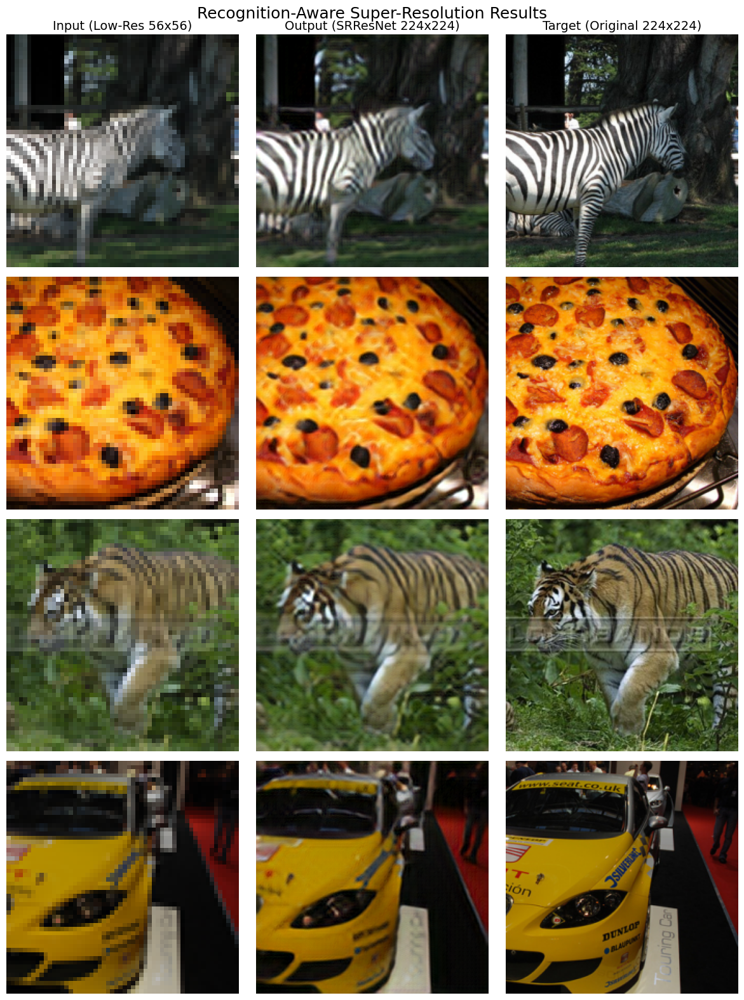

In [4]:
import matplotlib.pyplot as plt
import torch

def save_visual_results(model, dataloader, device, num_images=3, filename="thesis_comparison.png"):
    """
    Grabs a batch of images, plots the Low-Res, Super-Res, and High-Res 
    side-by-side, and saves a high-quality PNG for academic papers.
    """
    model.eval() # Ensure we are in evaluation mode
    
    # Grab one batch of data
    dataiter = iter(dataloader)
    lr_imgs, hr_imgs, _ = next(dataiter)
    
    # Move to GPU and generate images
    lr_imgs = lr_imgs.to(device)
    with torch.no_grad():
        sr_imgs = model(lr_imgs)
    
    # Move everything back to CPU for matplotlib
    lr_imgs = lr_imgs.cpu()
    sr_imgs = sr_imgs.cpu()
    hr_imgs = hr_imgs.cpu()

    # Set up the plot (Width: 12, Height scales with number of images)
    fig, axes = plt.subplots(num_images, 3, figsize=(12, 4 * num_images))
    plt.suptitle("Recognition-Aware Super-Resolution Results", fontsize=18, y=0.98)
    
    for i in range(num_images):
        # 1. Low Res Input (56x56)
        ax = axes[i, 0]
        img_lr = lr_imgs[i].permute(1, 2, 0).numpy()
        ax.imshow(img_lr)
        if i == 0: ax.set_title("Input (Low-Res 56x56)", fontsize=14)
        ax.axis('off')
        
        # 2. Model Output (Super-Res 224x224)
        ax = axes[i, 1]
        # Clamp just in case to avoid matplotlib warnings
        img_sr = torch.clamp(sr_imgs[i], 0.0, 1.0).permute(1, 2, 0).numpy()
        ax.imshow(img_sr)
        if i == 0: ax.set_title("Output (SRResNet 224x224)", fontsize=14)
        ax.axis('off')
        
        # 3. Target (Original High-Res 224x224)
        ax = axes[i, 2]
        img_hr = hr_imgs[i].permute(1, 2, 0).numpy()
        ax.imshow(img_hr)
        if i == 0: ax.set_title("Target (Original 224x224)", fontsize=14)
        ax.axis('off')

    plt.tight_layout()
    
    # Save the figure at 300 DPI (Print Quality)
    plt.savefig(filename, bbox_inches='tight', dpi=300)
    print(f"Image successfully saved as '{filename}' at 300 DPI.")
    
    # Display it in the notebook as well
    plt.show()

# ==========================================
# RUN THE VISUALIZER
# ==========================================
# Run this a few times until you get a batch of images you really like!
save_visual_results(visual_student, loader, device, num_images=4, filename="RA_SR_Results_Batch1.png")

 model and ImageNet dictionary
Generating images and evaluating recognition accuracy


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03164913..1.0633012].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.012557722..1.0013424].


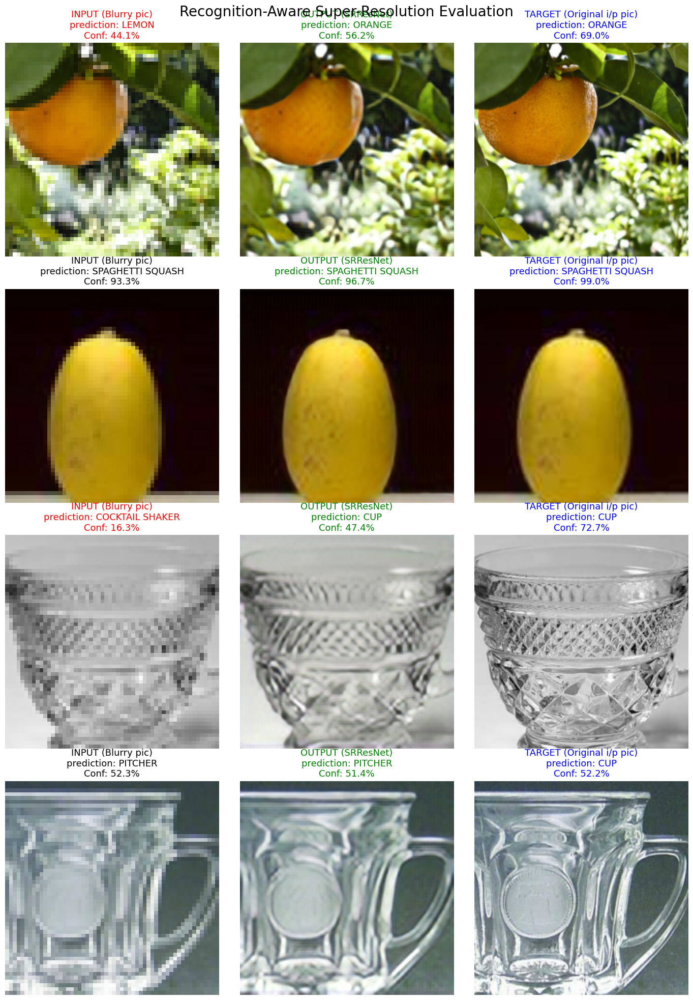

visualization saved as 'Proof.png' at 300 DPI.


In [35]:
import matplotlib.pyplot as plt
import torch
from torchvision import transforms, models

def save_recognition_aware_batch(student_model, dataloader, device, num_images=3, filename="thesis_ra_batch.png"):
    """
    Pulls a batch from the dataloader, generates super-resolution images, 
    and uses the Teacher model to predict the class of the LR, SR, and HR images.
    """
    student_model.eval()
    
    # 1. Initialize the Teacher Model for evaluation
    print(" model and ImageNet dictionary")
    teacher_model = FixedRecognitionModel().to(device)
    teacher_model.eval()
    
    # Grab PyTorch's built-in English names for the classes
    categories = models.ResNet18_Weights.IMAGENET1K_V1.meta["categories"]
    
    # 2. Grab one batch of data from the loader
    dataiter = iter(dataloader)
    lr_imgs, hr_imgs, _ = next(dataiter)
    
    # Move to GPU
    lr_imgs = lr_imgs.to(device)
    hr_imgs = hr_imgs.to(device)
    
    print("Generating images and evaluating recognition accuracy")
    with torch.no_grad():
        # Student generates images
        sr_imgs = student_model(lr_imgs)
        
        # Resize Low-Res to 224x224 so the Teacher can look at it fairly
        resize_224 = transforms.Resize((224, 224), antialias=True)
        lr_for_teacher = resize_224(lr_imgs)
        
        # Teacher evaluates all three versions
        lr_logits = teacher_model(lr_for_teacher)
        sr_logits = teacher_model(sr_imgs)
        hr_logits = teacher_model(hr_imgs)
        
        # Convert raw scores to percentages (softmax)
        lr_probs = torch.nn.functional.softmax(lr_logits, dim=1)
        sr_probs = torch.nn.functional.softmax(sr_logits, dim=1)
        hr_probs = torch.nn.functional.softmax(hr_logits, dim=1)

    # Move back to CPU for plotting
    lr_imgs = lr_imgs.cpu()
    sr_imgs = sr_imgs.cpu()
    hr_imgs = hr_imgs.cpu()

    # 3. Set up the plot
    fig, axes = plt.subplots(num_images, 3, figsize=(14, 5 * num_images))
    plt.suptitle("Recognition-Aware Super-Resolution Evaluation", fontsize=20, y=0.98)
    
    for i in range(num_images):
        # Extract the highest probability and the class name for this specific image
        # (We use .split(',')[0] to keep the names short and clean for the plot)
        lr_conf, lr_idx = torch.max(lr_probs[i], 0)
        lr_label = categories[lr_idx.item()].split(',')[0].upper()
        
        sr_conf, sr_idx = torch.max(sr_probs[i], 0)
        sr_label = categories[sr_idx.item()].split(',')[0].upper()
        
        hr_conf, hr_idx = torch.max(hr_probs[i], 0)
        hr_label = categories[hr_idx.item()].split(',')[0].upper()

        # --- Column 1: Low Res Input ---
        ax = axes[i, 0]
        ax.imshow(lr_imgs[i].permute(1, 2, 0).numpy())
        ax.set_title(f"INPUT (Blurry pic)\nprediction: {lr_label}\nConf: {lr_conf.item()*100:.1f}%", 
                     color='red' if lr_conf < 0.5 else 'black', fontsize=13)
        ax.axis('off')
        
        # --- Column 2: Super-Res Output ---
        ax = axes[i, 1]
        ax.imshow(torch.clamp(sr_imgs[i], 0.0, 1.0).permute(1, 2, 0).numpy())
        ax.set_title(f"OUTPUT (SRResNet)\nprediction: {sr_label}\nConf: {sr_conf.item()*100:.1f}%", 
                     color='green', fontsize=13)
        ax.axis('off')
        
        # --- Column 3: Ground Truth Target ---
        ax = axes[i, 2]
        ax.imshow(hr_imgs[i].permute(1, 2, 0).numpy())
        ax.set_title(f"TARGET (Original i/p pic)\nprediction: {hr_label}\nConf: {hr_conf.item()*100:.1f}%", 
                     color='blue', fontsize=13)
        ax.axis('off')

    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight', dpi=300)
    plt.show()
    print(f"visualization saved as '{filename}' at 300 DPI.")

# ==========================================
# RUN THE RA VISUALIZER
# ==========================================
# Ensure 'visual_student', 'loader', and 'device' are active from your previous cell
save_recognition_aware_batch(visual_student, loader, device, num_images=4, filename="Proof.png")

 model and ImageNet dictionary
Generating images and evaluating recognition accuracy


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.028768519..1.042203].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.005924376..0.9366505].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03235976..1.0495642].


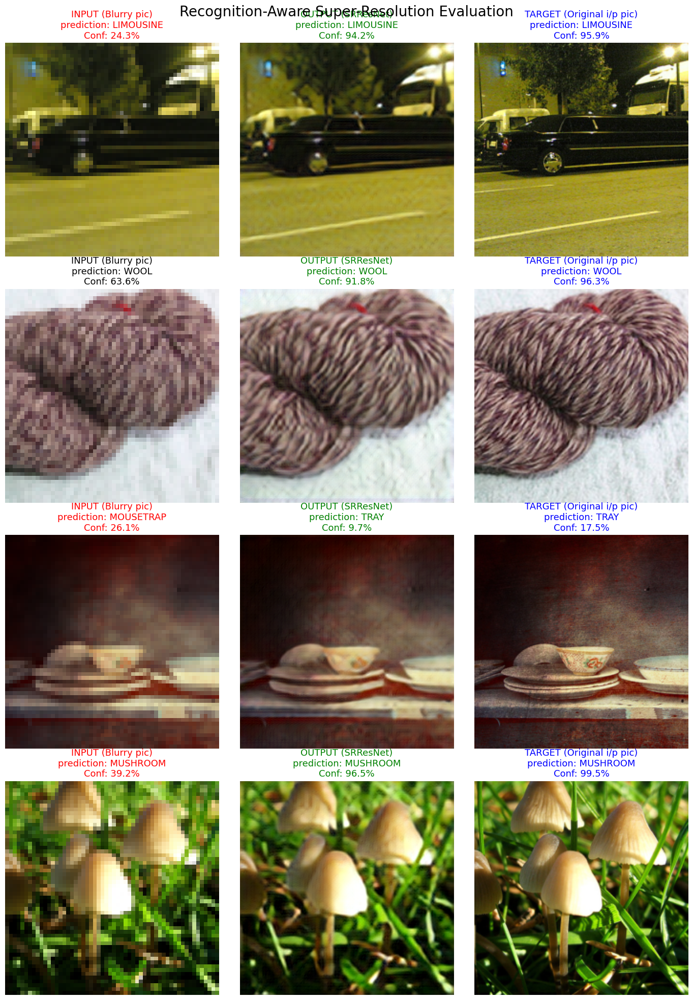

visualization saved as 'Proof.png' at 300 DPI.


In [49]:
import matplotlib.pyplot as plt
import torch
from torchvision import transforms, models

def save_recognition_aware_batch(student_model, dataloader, device, num_images=3, filename="thesis_ra_batch.png"):
    """
    Pulls a batch from the dataloader, generates super-resolution images, 
    and uses the Teacher model to predict the class of the LR, SR, and HR images.
    """
    student_model.eval()
    
    # 1. Initialize the Teacher Model for evaluation
    print(" model and ImageNet dictionary")
    teacher_model = FixedRecognitionModel().to(device)
    teacher_model.eval()
    
    # Grab PyTorch's built-in English names for the classes
    categories = models.ResNet18_Weights.IMAGENET1K_V1.meta["categories"]
    
    # 2. Grab one batch of data from the loader
    dataiter = iter(dataloader)
    lr_imgs, hr_imgs, _ = next(dataiter)
    
    # Move to GPU
    lr_imgs = lr_imgs.to(device)
    hr_imgs = hr_imgs.to(device)
    
    print("Generating images and evaluating recognition accuracy")
    with torch.no_grad():
        # Student generates images
        sr_imgs = student_model(lr_imgs)
        
        # Resize Low-Res to 224x224 so the Teacher can look at it fairly
        resize_224 = transforms.Resize((224, 224), antialias=True)
        lr_for_teacher = resize_224(lr_imgs)
        
        # Teacher evaluates all three versions
        lr_logits = teacher_model(lr_for_teacher)
        sr_logits = teacher_model(sr_imgs)
        hr_logits = teacher_model(hr_imgs)
        
        # Convert raw scores to percentages (softmax)
        lr_probs = torch.nn.functional.softmax(lr_logits, dim=1)
        sr_probs = torch.nn.functional.softmax(sr_logits, dim=1)
        hr_probs = torch.nn.functional.softmax(hr_logits, dim=1)

    # Move back to CPU for plotting
    lr_imgs = lr_imgs.cpu()
    sr_imgs = sr_imgs.cpu()
    hr_imgs = hr_imgs.cpu()

    # 3. Set up the plot
    fig, axes = plt.subplots(num_images, 3, figsize=(14, 5 * num_images))
    plt.suptitle("Recognition-Aware Super-Resolution Evaluation", fontsize=20, y=0.98)
    
    for i in range(num_images):
        # Extract the highest probability and the class name for this specific image
        # (We use .split(',')[0] to keep the names short and clean for the plot)
        lr_conf, lr_idx = torch.max(lr_probs[i], 0)
        lr_label = categories[lr_idx.item()].split(',')[0].upper()
        
        sr_conf, sr_idx = torch.max(sr_probs[i], 0)
        sr_label = categories[sr_idx.item()].split(',')[0].upper()
        
        hr_conf, hr_idx = torch.max(hr_probs[i], 0)
        hr_label = categories[hr_idx.item()].split(',')[0].upper()

        # --- Column 1: Low Res Input ---
        ax = axes[i, 0]
        ax.imshow(lr_imgs[i].permute(1, 2, 0).numpy())
        ax.set_title(f"INPUT (Blurry pic)\nprediction: {lr_label}\nConf: {lr_conf.item()*100:.1f}%", 
                     color='red' if lr_conf < 0.5 else 'black', fontsize=13)
        ax.axis('off')
        
        # --- Column 2: Super-Res Output ---
        ax = axes[i, 1]
        ax.imshow(torch.clamp(sr_imgs[i], 0.0, 1.0).permute(1, 2, 0).numpy())
        ax.set_title(f"OUTPUT (SRResNet)\nprediction: {sr_label}\nConf: {sr_conf.item()*100:.1f}%", 
                     color='green', fontsize=13)
        ax.axis('off')
        
        # --- Column 3: Ground Truth Target ---
        ax = axes[i, 2]
        ax.imshow(hr_imgs[i].permute(1, 2, 0).numpy())
        ax.set_title(f"TARGET (Original i/p pic)\nprediction: {hr_label}\nConf: {hr_conf.item()*100:.1f}%", 
                     color='blue', fontsize=13)
        ax.axis('off')

    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight', dpi=300)
    plt.show()
    print(f"visualization saved as '{filename}' at 300 DPI.")

# ==========================================
# RUN THE RA VISUALIZER
# ==========================================
# Ensure 'visual_student', 'loader', and 'device' are active from your previous cell
save_recognition_aware_batch(visual_student, loader, device, num_images=4, filename="Proof.png")

 model and ImageNet dictionary
Generating images and evaluating recognition accuracy


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.028052535..1.0123869].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.098043665..1.0115966].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.008282788..0.9616474].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.023499934..1.0018907].


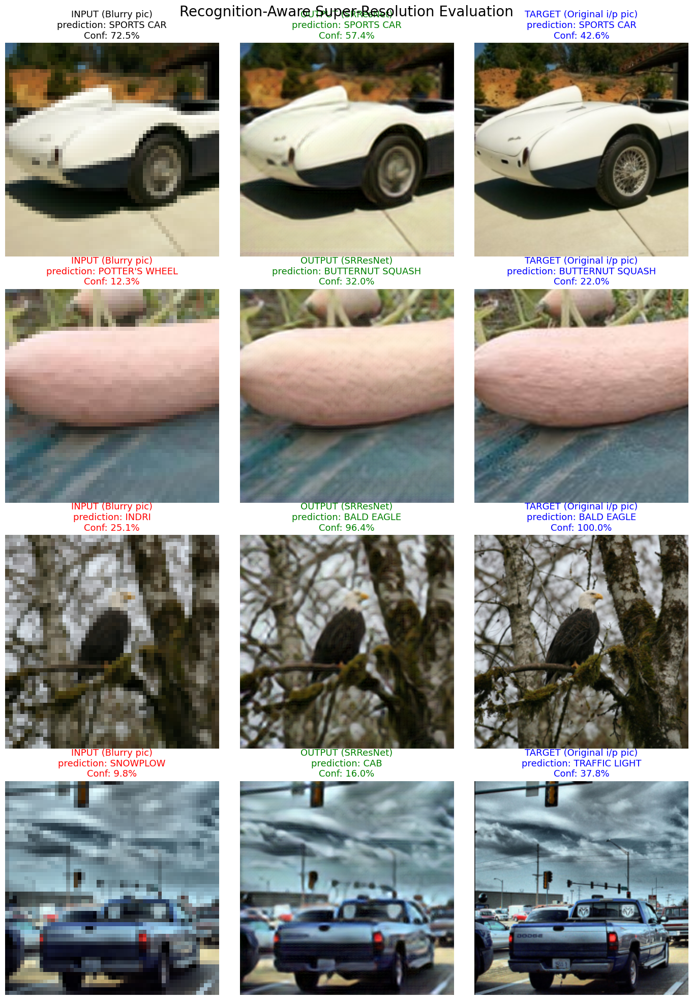

visualization saved as 'Proof.png' at 300 DPI.


In [47]:
import matplotlib.pyplot as plt
import torch
from torchvision import transforms, models

def save_recognition_aware_batch(student_model, dataloader, device, num_images=3, filename="thesis_ra_batch.png"):
    """
    Pulls a batch from the dataloader, generates super-resolution images, 
    and uses the Teacher model to predict the class of the LR, SR, and HR images.
    """
    student_model.eval()
    
    # 1. Initialize the Teacher Model for evaluation
    print(" model and ImageNet dictionary")
    teacher_model = FixedRecognitionModel().to(device)
    teacher_model.eval()
    
    # Grab PyTorch's built-in English names for the classes
    categories = models.ResNet18_Weights.IMAGENET1K_V1.meta["categories"]
    
    # 2. Grab one batch of data from the loader
    dataiter = iter(dataloader)
    lr_imgs, hr_imgs, _ = next(dataiter)
    
    # Move to GPU
    lr_imgs = lr_imgs.to(device)
    hr_imgs = hr_imgs.to(device)
    
    print("Generating images and evaluating recognition accuracy")
    with torch.no_grad():
        # Student generates images
        sr_imgs = student_model(lr_imgs)
        
        # Resize Low-Res to 224x224 so the Teacher can look at it fairly
        resize_224 = transforms.Resize((224, 224), antialias=True)
        lr_for_teacher = resize_224(lr_imgs)
        
        # Teacher evaluates all three versions
        lr_logits = teacher_model(lr_for_teacher)
        sr_logits = teacher_model(sr_imgs)
        hr_logits = teacher_model(hr_imgs)
        
        # Convert raw scores to percentages (softmax)
        lr_probs = torch.nn.functional.softmax(lr_logits, dim=1)
        sr_probs = torch.nn.functional.softmax(sr_logits, dim=1)
        hr_probs = torch.nn.functional.softmax(hr_logits, dim=1)

    # Move back to CPU for plotting
    lr_imgs = lr_imgs.cpu()
    sr_imgs = sr_imgs.cpu()
    hr_imgs = hr_imgs.cpu()

    # 3. Set up the plot
    fig, axes = plt.subplots(num_images, 3, figsize=(14, 5 * num_images))
    plt.suptitle("Recognition-Aware Super-Resolution Evaluation", fontsize=20, y=0.98)
    
    for i in range(num_images):
        # Extract the highest probability and the class name for this specific image
        # (We use .split(',')[0] to keep the names short and clean for the plot)
        lr_conf, lr_idx = torch.max(lr_probs[i], 0)
        lr_label = categories[lr_idx.item()].split(',')[0].upper()
        
        sr_conf, sr_idx = torch.max(sr_probs[i], 0)
        sr_label = categories[sr_idx.item()].split(',')[0].upper()
        
        hr_conf, hr_idx = torch.max(hr_probs[i], 0)
        hr_label = categories[hr_idx.item()].split(',')[0].upper()

        # --- Column 1: Low Res Input ---
        ax = axes[i, 0]
        ax.imshow(lr_imgs[i].permute(1, 2, 0).numpy())
        ax.set_title(f"INPUT (Blurry pic)\nprediction: {lr_label}\nConf: {lr_conf.item()*100:.1f}%", 
                     color='red' if lr_conf < 0.5 else 'black', fontsize=13)
        ax.axis('off')
        
        # --- Column 2: Super-Res Output ---
        ax = axes[i, 1]
        ax.imshow(torch.clamp(sr_imgs[i], 0.0, 1.0).permute(1, 2, 0).numpy())
        ax.set_title(f"OUTPUT (SRResNet)\nprediction: {sr_label}\nConf: {sr_conf.item()*100:.1f}%", 
                     color='green', fontsize=13)
        ax.axis('off')
        
        # --- Column 3: Ground Truth Target ---
        ax = axes[i, 2]
        ax.imshow(hr_imgs[i].permute(1, 2, 0).numpy())
        ax.set_title(f"TARGET (Original i/p pic)\nprediction: {hr_label}\nConf: {hr_conf.item()*100:.1f}%", 
                     color='blue', fontsize=13)
        ax.axis('off')

    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight', dpi=300)
    plt.show()
    print(f"visualization saved as '{filename}' at 300 DPI.")

# ==========================================
# RUN THE RA VISUALIZER
# ==========================================
# Ensure 'visual_student', 'loader', and 'device' are active from your previous cell
save_recognition_aware_batch(visual_student, loader, device, num_images=4, filename="Proof.png")

In [52]:
import torch
from torchvision import transforms
from tqdm import tqdm

def evaluate_no_processing_baseline(dataloader, device):
    print("Loading model for Baseline Test")
    teacher = FixedRecognitionModel().to(device)
    teacher.eval() # Lock it!
    
    running_correct = 0
    total_samples = 0
    
    # This is the "No Processing" method: Just mathematically stretching the image
    resize_224 = transforms.Resize((224, 224), interpolation=transforms.InterpolationMode.BICUBIC, antialias=True)
    
    print("Grading the blurry baseline images...")
    with torch.no_grad():
        for lr_imgs, _, labels in tqdm(dataloader, desc="Testing Baseline"):
            lr_imgs = lr_imgs.to(device)
            labels = labels.to(device)
            
            # 1. Stretch the 56x56 images to 224x224
            stretched_imgs = resize_224(lr_imgs)
            
            # 2. Ask the Teacher what it sees
            logits = teacher(stretched_imgs)
            _, predictions = torch.max(logits, 1)
            
            running_correct += (predictions == labels).sum().item()
            total_samples += labels.size(0)
            
    baseline_acc = (running_correct / total_samples) * 100
    print(f"\n NO PROCESSING COMPLETE")
    print(f"Accuracy: {baseline_acc:.2f}%")
    return baseline_acc

# Run it! (Assuming 'loader' and 'device' are active in your Kaggle session)
baseline_accuracy = evaluate_no_processing_baseline(loader, device)

Loading model for Baseline Test
Grading the blurry baseline images...


Testing Baseline: 100%|██████████| 1622/1622 [02:13<00:00, 12.17it/s]


 NO PROCESSING COMPLETE
Accuracy: 48.44%
